#### Pre-requisites

Install filterpy version: filterpy-1.4.5

Install imutils-0.5.4

imutils is only required for camera vide capture and file writes

**Video Source**: https://drive.google.com/drive/folders/1NEqO0fvyva1dyceaNJlsIrmHDU-b-ypK?usp=sharing

**About the Execution Enviornment**: The code was run in Kaggle and a subset of the processed frames captured

In [ ]:
!pip install filterpy
import cv2
from IPython.display import display, Image
import numpy as np
import networkx as nx
from scipy.spatial.distance import euclidean
from filterpy.kalman import KalmanFilter
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 4.6 MB/s eta 0:00:0000:01
  Preparing metadata (setup.py) ... done
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110458 sha256=48b2c0a9d160cd5c7542ce04c137b8fb2fa58a4986856d8d7ba4414a4dadc04b
  Stored in directory: /root/.cache/pip/wheels/0f/0c/ea/218f266af4ad626897562199fbbcba521b8497303200186102
Successfully built filterpy


### Kalman filter object tracking

The Kalman filter is a recursive algorithm used for estimating the state of a linear dynamic system corrupted by noise. In object tracking, it predicts the future state of an object based on its previous state and noisy measurements. By iteratively updating the predicted state with new measurements, the Kalman filter provides a more accurate and robust estimation of the object's trajectory, even in the presence of uncertainty and measurement errors. This makes it widely used in applications such as visual tracking, radar tracking, and navigation systems.

In [ ]:
# Create a Kalman Filter model
kf = KalmanFilter(dim_x=2, dim_z=1)

# Define the state transition matrix
kf.F = np.array([[1, 1], [0, 1]])

# Define the observation matrix
kf.H = np.array([[1, 0]])

# Define the initial state [position, velocity]
kf.x = np.array([0, 1])

# Define the initial covariance matrix
kf.P *= 1e3

# Define the process noise covariance matrix
kf.Q = np.array([[1e-5, 1e-4], [1e-4, 1e-3]])

# Define the measurement noise covariance
kf.R = 0.01

# Generate synthetic data (true position) and add noise
true_positions = np.linspace(0, 10, 100)
measurements = true_positions + np.random.normal(0, np.sqrt(kf.R), len(true_positions))

# Kalman Filter loop
filtered_states = []
for z in measurements:
    kf.predict()
    kf.update(z)
    filtered_states.append(kf.x.copy())

filtered_states = np.array(filtered_states)


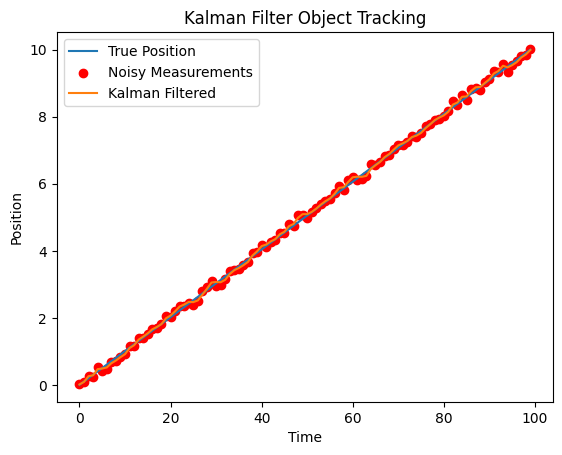

In [ ]:
# Plotting
plt.plot(true_positions, label='True Position')
plt.scatter(range(len(measurements)), measurements, color='red', label='Noisy Measurements')
plt.plot(filtered_states[:, 0], label='Kalman Filtered')
plt.legend()
plt.xlabel('Time')
plt.ylabel('Position')
plt.title('Kalman Filter Object Tracking')
plt.show()


### Video Motion Tracking using Kalman Filter

In [ ]:
class KalmanFilters(object):
    def __init__(self, dt, u_x,u_y, std_acc, x_std_meas, y_std_meas):
        """
        :param dt: sampling time (time for 1 cycle)
        :param u_x: acceleration in x-direction
        :param u_y: acceleration in y-direction
        :param std_acc: process noise magnitude
        :param x_std_meas: standard deviation of the measurement in x-direction
        :param y_std_meas: standard deviation of the measurement in y-direction
        """

        # Define sampling time
        self.dt = dt

        # Define the  control input variables
        self.u = np.matrix([[u_x],[u_y]])

        # Intial State
        self.x = np.matrix([[0], [0], [0], [0]])

        # Define the State Transition Matrix A
        self.A = np.matrix([[1, 0, self.dt, 0],
                            [0, 1, 0, self.dt],
                            [0, 0, 1, 0],
                            [0, 0, 0, 1]])

        # Define the Control Input Matrix B
        self.B = np.matrix([[(self.dt**2)/2, 0],
                            [0,(self.dt**2)/2],
                            [self.dt,0],
                            [0,self.dt]])

        # Define Measurement Mapping Matrix
        self.H = np.matrix([[1, 0, 0, 0],
                            [0, 1, 0, 0]])

        #Initial Process Noise Covariance
        self.Q = np.matrix([[(self.dt**4)/4, 0, (self.dt**3)/2, 0],
                            [0, (self.dt**4)/4, 0, (self.dt**3)/2],
                            [(self.dt**3)/2, 0, self.dt**2, 0],
                            [0, (self.dt**3)/2, 0, self.dt**2]]) * std_acc**2

        #Initial Measurement Noise Covariance
        self.R = np.matrix([[x_std_meas**2,0],
                           [0, y_std_meas**2]])

        #Initial Covariance Matrix
        self.P = np.eye(self.A.shape[1])

    def predict(self):
        # Refer to :Eq.(9) and Eq.(10)  in https://machinelearningspace.com/object-tracking-simple-implementation-of-kalman-filter-in-python/?preview_id=1364&preview_nonce=52f6f1262e&preview=true&_thumbnail_id=1795

        # Update time state
        #x_k =Ax_(k-1) + Bu_(k-1)     Eq.(9)
        self.x = np.dot(self.A, self.x) + np.dot(self.B, self.u)

        # Calculate error covariance
        # P= A*P*A' + Q               Eq.(10)
        self.P = np.dot(np.dot(self.A, self.P), self.A.T) + self.Q
        return self.x[0:2]

    def update(self, z):

        # Refer to :Eq.(11), Eq.(12) and Eq.(13)  in https://machinelearningspace.com/object-tracking-simple-implementation-of-kalman-filter-in-python/?preview_id=1364&preview_nonce=52f6f1262e&preview=true&_thumbnail_id=1795
        # S = H*P*H'+R
        S = np.dot(self.H, np.dot(self.P, self.H.T)) + self.R

        # Calculate the Kalman Gain
        # K = P * H'* inv(H*P*H'+R)
        K = np.dot(np.dot(self.P, self.H.T), np.linalg.inv(S))  #Eq.(11)

        self.x = np.round(self.x + np.dot(K, (z - np.dot(self.H, self.x))))   #Eq.(12)

        I = np.eye(self.H.shape[1])

        # Update error covariance matrix
        self.P = (I - (K * self.H)) * self.P   #Eq.(13)
        return self.x[0:2]

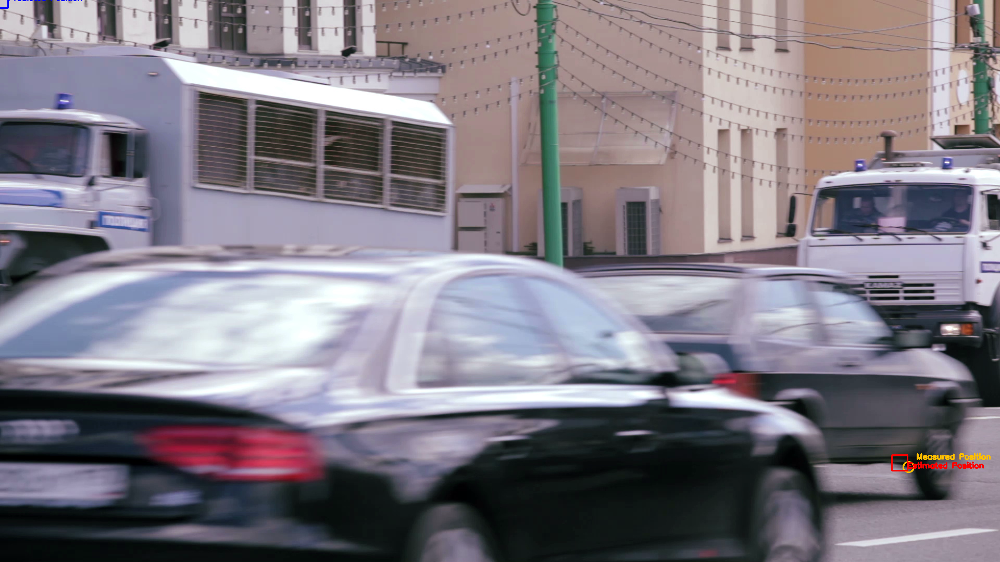

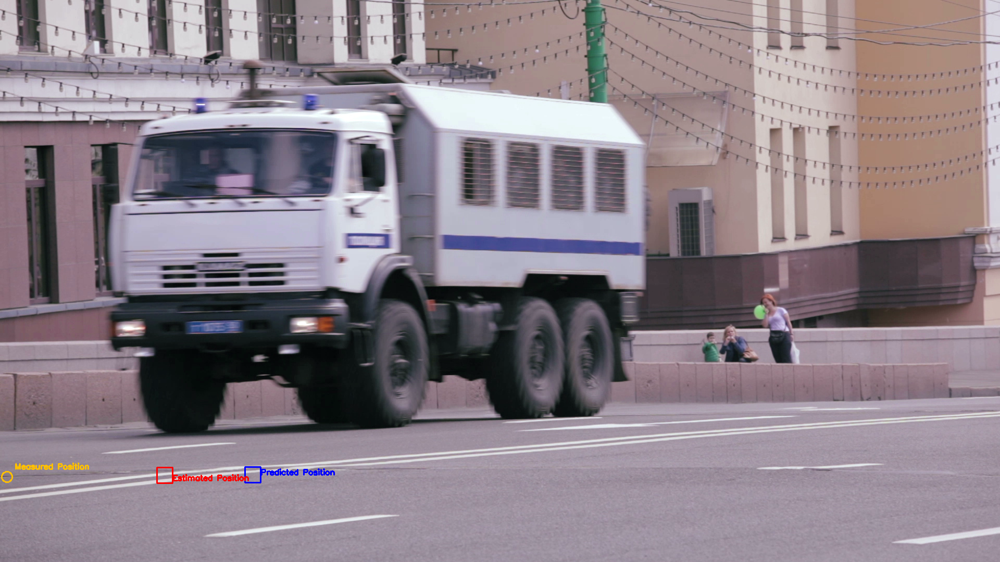

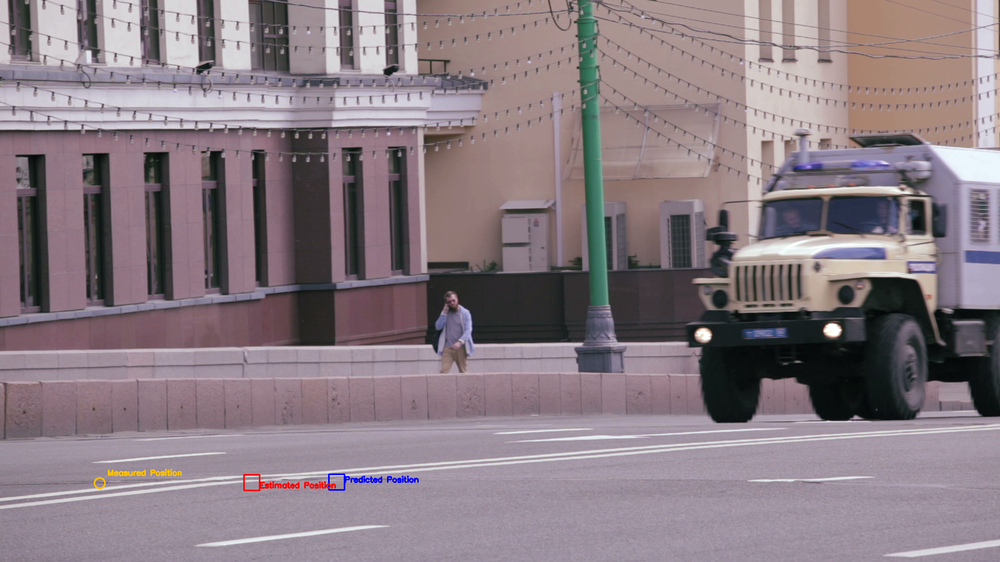

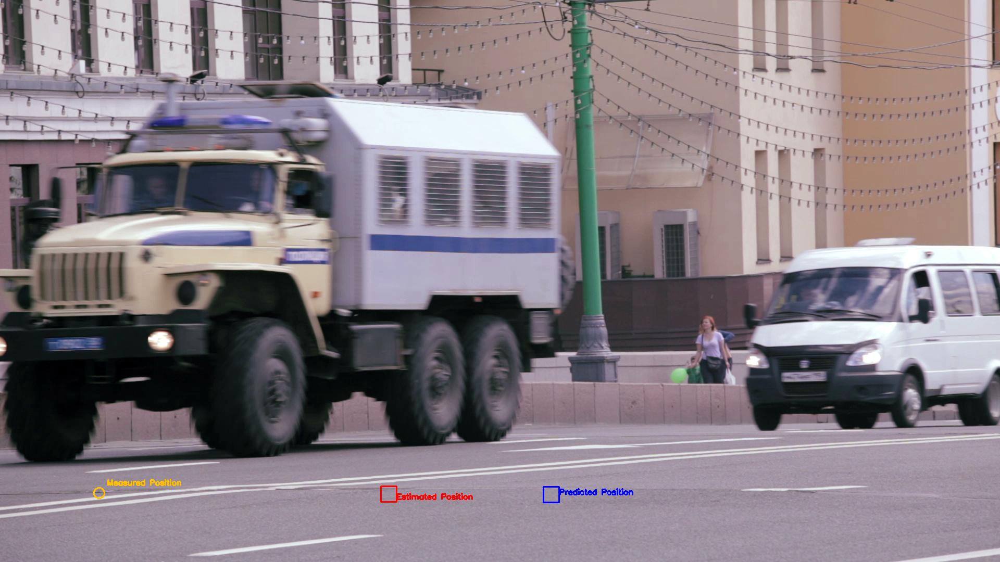

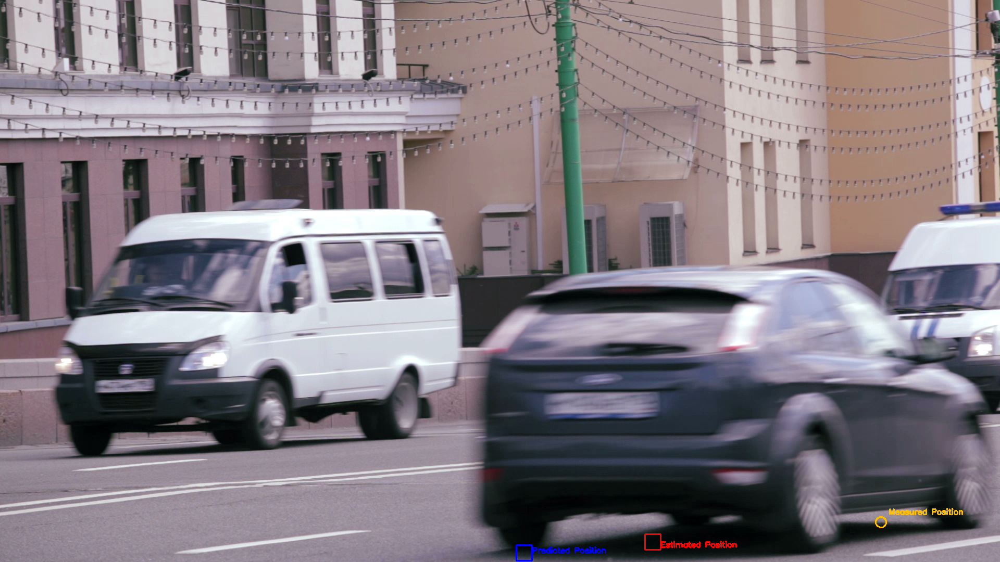

In [ ]:
import cv2
from IPython.display import display, Image
import numpy as np
import networkx as nx
from scipy.spatial.distance import euclidean
from filterpy.kalman import KalmanFilter
import matplotlib.pyplot as plt

# Create opencv video capture object
VideoCap = cv2.VideoCapture('/kaggle/input/va-test-traffic/VA_traffic.mov')

# Create KalmanFilter object KF
KF = KalmanFilters(0.1, 1, 1, 1, 0.1, 0.1)

# Counter to keep track of saved frames
frame_counter = 0

while True:
    # Read frame
    ret, frame = VideoCap.read()
    if not ret:
        break

    # Convert frame from BGR to GRAY
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Edge detection using Canny function
    img_edges = cv2.Canny(gray,  50, 190, 3)

    # Convert to black and white image
    ret, img_thresh = cv2.threshold(img_edges, 254, 255,cv2.THRESH_BINARY)

    # Find contours
    contours, _ = cv2.findContours(img_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Set the accepted minimum & maximum radius of a detected object
    min_radius_thresh= 3
    max_radius_thresh= 30

    centers=[]
    for c in contours:
        (x, y), radius = cv2.minEnclosingCircle(c)
        radius = int(radius)

        #Take only the valid circle(s)
        if (radius > min_radius_thresh) and (radius < max_radius_thresh):
            centers.append(np.array([[x], [y]]))

    # If centroids are detected then track them
    if len(centers) > 0:
        # Draw the detected circle
        cv2.circle(frame, (int(centers[0][0]), int(centers[0][1])), 10, (0, 191, 255), 2)

        # Predict
        x, y = KF.predict()
        # Draw a rectangle as the predicted object position
        cv2.rectangle(frame, (int(x - 15), int(y - 15)), (int(x + 15), int(y + 15)), (255, 0, 0), 2)

        # Update
        x1, y1 = KF.update(centers[0])

        # Draw a rectangle as the estimated object position
        cv2.rectangle(frame, (int(x1 - 15), int(y1 - 15)), (int(x1 + 15), int(y1 + 15)), (0, 0, 255), 2)

        cv2.putText(frame, "Estimated Position", (int(x1 + 15), int(y1 + 10)), 0, 0.5, (0, 0, 255), 2)
        cv2.putText(frame, "Predicted Position", (int(x + 15), int(y)), 0, 0.5, (255, 0, 0), 2)
        cv2.putText(frame, "Measured Position", (int(centers[0][0] + 15), int(centers[0][1] - 15)), 0, 0.5, (0, 191, 255), 2)

        if frame_counter % 50 == 0:
            display(Image(data=cv2.imencode('.png', frame)[1].tobytes(), format='png'))

        # Increment frame counter
        frame_counter += 1

VideoCap.release()


### Template Matching with Normalized Gradient Correlation(NGC)

Template Matching with Normalized Gradient Correlation (NGC) is a method used for detecting patterns within an image by comparing their gradients. It calculates the correlation between the gradient orientations and magnitudes of the template and the target image. By normalizing the correlation, NGC is robust to changes in illumination and contrast, providing accurate template matching results. This technique is particularly useful in scenarios where traditional template matching methods struggle, such as in the presence of varying lighting conditions or perspective distortions.

In [2]:

# Load video file or use a camera
cap = cv2.VideoCapture('/kaggle/input/video-seg/Video_seg.mp4')

# Read the template image
template = cv2.imread('/kaggle/input/template/template.png', cv2.IMREAD_GRAYSCALE) # Replace with the path to your template image
print("Template Image")
display(Image(data=cv2.imencode('.png', template)[1].tobytes(), format='png'))

# Get template size
h, w = template.shape
# Define the termination criteria for the template matching
criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 1)

while True:
    # Read the current frame
    ret, frame = cap.read()
    if not ret:
        break

    # Convert the current frame to grayscale
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Apply template matching
    result = cv2.matchTemplate(gray_frame, template, cv2.TM_CCOEFF_NORMED)
    _, max_val, _, max_loc = cv2.minMaxLoc(result)

    # Display the frame only if a match is found
    if max_val > 0.8:
        top_left = max_loc
        bottom_right = (top_left[0] + w, top_left[1] + h)
        cv2.rectangle(frame, top_left, bottom_right, (0, 255, 0), 2)
        display(Image(data=cv2.imencode('.png', frame)[1].tobytes(), format='png'))

# Release the video capture object and close all windows
cap.release()


**Note**: Code for Motion tracking using KLT was covered to a great extent in the Motionn Detection and Estimation assignment and so was Lucas Kanade